<h1 style= 'text-align: center;'>A COMPREHENSIVE DATA ANALYSIS ON CHICAGO CRIMES (2024 - 2025)</h1>
<h3 style= 'text-align: center;'>MIDTERM HANDS- ON EXAMINATION</h3>
<hr>
<p><i>Analyst</i> <b>Johnrey Mansilungan</b></p>

In [311]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Chicago_Crimes.csv')

<h2>CHANGING DATA TYPES</h2>

In [325]:
#OBJECT TO CATEGORY
df['ID'] = df['ID'].astype('category')
df['Case Number'] = df['Case Number'].astype('category')
df['Block'] = df['Block'].astype('category')
df['IUCR'] = df['IUCR'].astype('category')
df['Primary Type'] = df['Primary Type'].astype('category')
df['Description'] = df['Description'].astype('category')
df['Location Description'] = df['Location Description'].astype('category')
df['FBI Code'] = df['FBI Code'].astype('category')

#CLEANING NECESSARY DATES
df['Date'] = df['Date'].astype('str')
df['Date'].str.strip()
df['Date'].replace('-', '/')

df['Updated On'] = df['Updated On'].astype('str')
df['Updated On'].str.strip()
df['Updated On'].replace('-', '/')

#DATE OBJECT TO DATETIME DATA
df['Date'] = pd.to_datetime(df['Date'])
df['Updated On'] = pd.to_datetime(df['Updated On'])

#CREATING NEW COLUMN FOR DATES
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['DayOfWeek'] = df['Date'].dt.dayofweek
df['Time'] = df['Date'].dt.time
df['Hour'] = df['Date'].dt.hour
df['DayOfWeekName'] = df['Date'].dt.day_name()


#WEEKEND/ WEEKDAYS
#df['Day'] = 'Weekday'
#df.loc[df['DayOfWeek'].isin([4, 5, 6]), 'Day'] = "Weekend"

#df.dtypes

In [267]:
#ADDING NAMES TO COMMUNITY AREA
communityAreaMap = {
    1: "Rogers Park", 2: "West Ridge", 3: "Uptown", 4: "Lincoln Square", 5: "North Center",
    6: "Lake View", 7: "Lincoln Park", 8: "Edgewater", 9: "Near North Side", 10: "Edison Park",
    11: "Norwood Park", 12: "Jefferson Park", 13: "Forest Glen", 14: "North Park", 15: "Albany Park",
    16: "Portage Park", 17: "Irving Park", 18: "Dunning", 19: "Montclare", 20: "Belmont Cragin",
    21: "Hermosa", 22: "Avondale", 23: "Logan Square", 24: "Humboldt Park", 25: "West Town",
    26: "Austin", 27: "West Garfield Park", 28: "East Garfield Park", 29: "Near West Side", 30: "North Lawndale",
    31: "South Lawndale", 32: "Lower West Side", 33: "Loop", 34: "Near South Side", 35: "Armour Square",
    36: "Douglas", 37: "Oakland", 38: "Fuller Park", 39: "Grand Boulevard", 40: "Kenwood",
    41: "Washington Park", 42: "Hyde Park", 43: "Woodlawn", 44: "South Shore", 45: "Chatham",
    46: "Avalon Park", 47: "South Chicago", 48: "Burnside", 49: "Calumet Heights", 50: "Roseland",
    51: "Pullman", 52: "South Deering", 53: "East Side", 54: "West Pullman", 55: "Riverdale",
    56: "Hegewisch", 57: "Garfield Ridge", 58: "Archer Heights", 59: "Brighton Park", 60: "McKinley Park",
    61: "Bridgeport", 62: "New City", 63: "Back of the Yards", 64: "Washington Heights", 65: "Morgan Park",
    66: "O'Hare", 67: "Edgewater", 68: "Albany Park", 69: "Irving Park", 70: "Jefferson Park",
    71: "Forest Glen", 72: "North Park", 73: "Lincoln Square", 74: "Lake View", 75: "Loop",
    76: "Near South Side", 77: "O’Hare"
}


<h2>HANDLING MISSING VALUES</h2>

In [4]:
df['Location Description'] = df['Location Description'].fillna(df['Location Description'].mode()[0])
df['Community Area'] = df['Community Area'].fillna(df['Community Area'].mode()[0])
df['X Coordinate'] = df['X Coordinate'].fillna(df['X Coordinate'].mean())
df['Y Coordinate'] = df['Y Coordinate'].fillna(df['Y Coordinate'].mean())
df['Latitude'] = df['Latitude'].fillna(df['Latitude'].mean())
df['Longitude'] = df['Longitude'].fillna(df['Longitude'].mean())
df['Location'] = df['Location'].fillna(df['Location'].mode()[0])

#df.isnull().sum()

In [5]:
df

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Month,Day,DayOfWeek,Time
0,13439321,JH237424,2024-04-14,040XX S PRAIRIE AVE,0890,THEFT,FROM BUILDING,APARTMENT,False,False,...,1878256.0,2024,2024-12-21 15:40:46,41.821236,-87.619921,"(41.821236024, -87.619920712)",4,14,6,00:00:00
1,13437420,JH234779,2024-04-14,023XX W CERMAK RD,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,COMMERCIAL / BUSINESS OFFICE,False,False,...,1889347.0,2024,2024-12-21 15:40:46,41.852052,-87.683801,"(41.852051675, -87.683800849)",4,14,6,00:00:00
2,13428676,JH224478,2024-04-14,043XX W LE MOYNE ST,0917,MOTOR VEHICLE THEFT,"CYCLE, SCOOTER, BIKE WITH VIN",STREET,False,False,...,1909501.0,2024,2024-12-21 15:40:46,41.907640,-87.735587,"(41.907640473, -87.735587478)",4,14,6,00:00:00
3,13429357,JH225293,2024-04-14,039XX W ADAMS ST,143A,WEAPONS VIOLATION,UNLAWFUL POSSESSION - HANDGUN,STREET,True,False,...,1898721.0,2024,2024-12-21 15:40:46,41.877997,-87.724121,"(41.877997275, -87.724120826)",4,14,6,00:00:00
4,13430098,JH226395,2024-04-14,011XX W 112TH PL,0890,THEFT,FROM BUILDING,RESIDENCE,False,False,...,1830157.0,2024,2024-12-21 15:40:46,41.689421,-87.650123,"(41.6894214, -87.650123247)",4,14,6,00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249118,13805239,JJ217509,2025-04-12,029XX W LOGAN BLVD,2826,OTHER OFFENSE,HARASSMENT BY ELECTRONIC MEANS,APARTMENT,False,False,...,1917149.0,2025,2025-04-19 15:41:24,41.928440,-87.700416,"(41.928439867, -87.700415972)",4,12,5,00:00:00
249119,13804023,JJ215813,2025-04-12,094XX S HARVARD AVE,0430,BATTERY,AGGRAVATED - OTHER DANGEROUS WEAPON,STREET,False,False,...,1842631.0,2025,2025-04-19 15:41:24,41.723545,-87.632040,"(41.723545182, -87.632039508)",4,12,5,00:00:00
249120,13803926,JJ215943,2025-04-12,084XX S VINCENNES AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,1848976.0,2025,2025-04-19 15:41:24,41.740998,-87.638606,"(41.74099774, -87.638606337)",4,12,5,00:00:00
249121,13803475,JJ215338,2025-04-12,050XX S ABERDEEN ST,0530,ASSAULT,AGGRAVATED - OTHER DANGEROUS WEAPON,STREET,True,False,...,1871348.0,2025,2025-04-19 15:41:24,41.802477,-87.652657,"(41.802477219, -87.652657244)",4,12,5,00:00:00


<h1 style= 'text-align: center;'>Exploratory Data Analysis (EDA)</h1>
<p style= 'text-align: center;'><i>From basic analysis going to more complex</i></p>
<hr>
<p><i>Note: This analysis was intended to be a continuous, comprehensive narrative read, so I rarely add questions.</i></p>

In [388]:
dfCount = df.value_counts().sum()
locations = len(df['Location Description'].unique())

print(f'Crime count between 2024 and 2025: {dfCount} in {locations} different')

Crime count between 2024 and 2025: 249123 in 128 different


<hr>
<p>Between <b>April 2024</b> and <b>April 2025</b>, there were <b>249,123</b> recorded crimes across Chicago, spanning <b>129</b> different locations.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 1</i></b></p>

<h1>Temporal Trends – When do crimes occur?</h1>

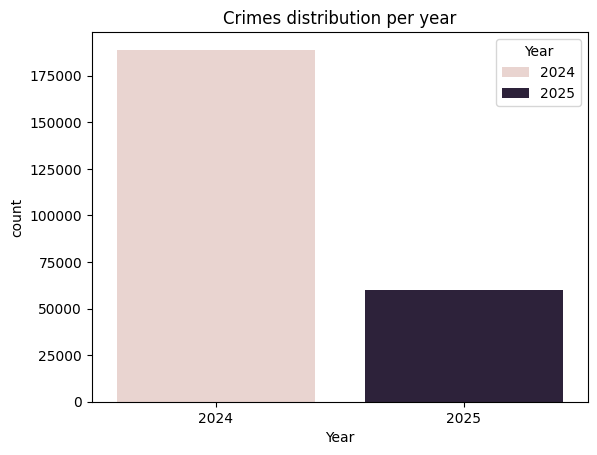

Year
2024    188918
2025     60205
Name: count, dtype: int64


In [60]:
sns.countplot(data = df, x= 'Year', hue = 'Year')
plt.title('Crimes distribution per year')
plt.show()
print(df['Year'].value_counts())

<hr>
<p><b>2024</b> recorded the most crimes among both years with <b>188,918</b> which is a clear giveaway since we only got a quarter of the year amount of data in the year <b>2025</b> (<b>January - April 2025</b>) compared to <b>2024</b> with 3/4 of the year (<b>April - December 2024</b>).</p>

<p style = 'text-align: right;'><b><i>INSIGHT 2</i></b></p>

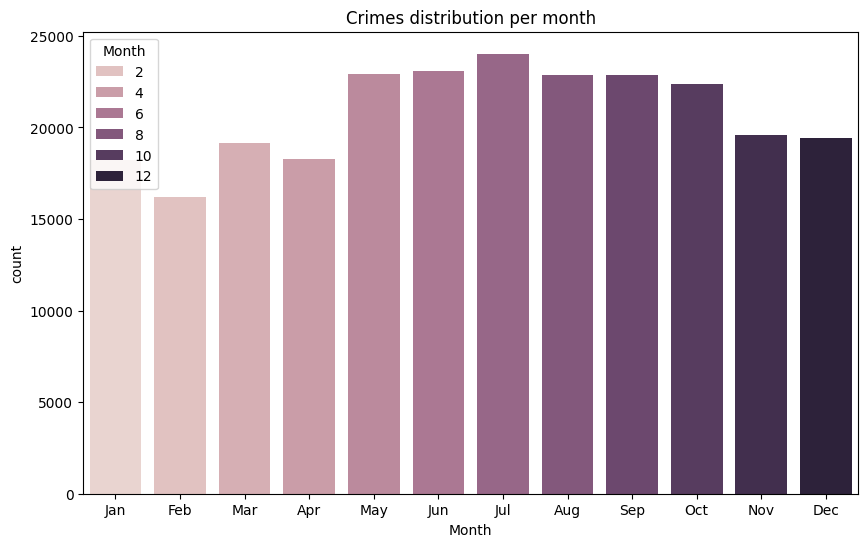

In [62]:
plt.figure(figsize=(10, 6))
sns.countplot(data = df, x= 'Month', hue= "Month")
plt.xticks(range(0, 12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.title('Crimes distribution per month')
plt.show()
#print(df['Month'].value_counts())

<hr>
<p>In the span of 1 year (April 2024 - April 2025), <b>July</b> accounts for the most crimes. The month of love, <b>February</b> recorded the least crimes which I think have some obvious reason.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 3</i></b></p>

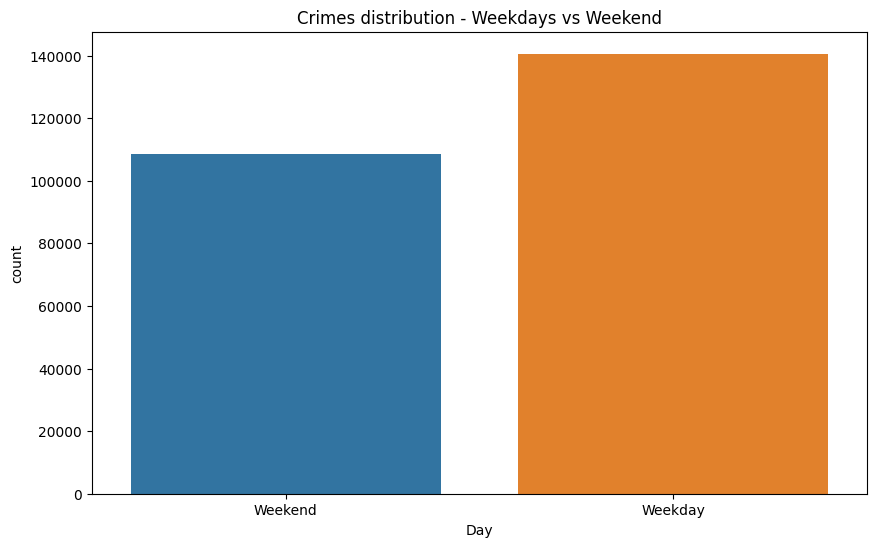

In [66]:
df['Day'] = 'Weekday'
df.loc[df['DayOfWeek'].isin([4, 5, 6]), 'Day'] = "Weekend"

plt.figure(figsize=(10, 6))
sns.countplot(data = df, x= 'Day', hue= "Day")
plt.title('Crimes distribution - Weekdays vs Weekend')
plt.show()

<hr>
<p><b style='color:red;'>Crimes</b> occur more frequently on <b>weekdays</b> compared to <b>weekends</b>. This could be related to increased activity and opportunities for crime during the work week.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 4</i></b></p>

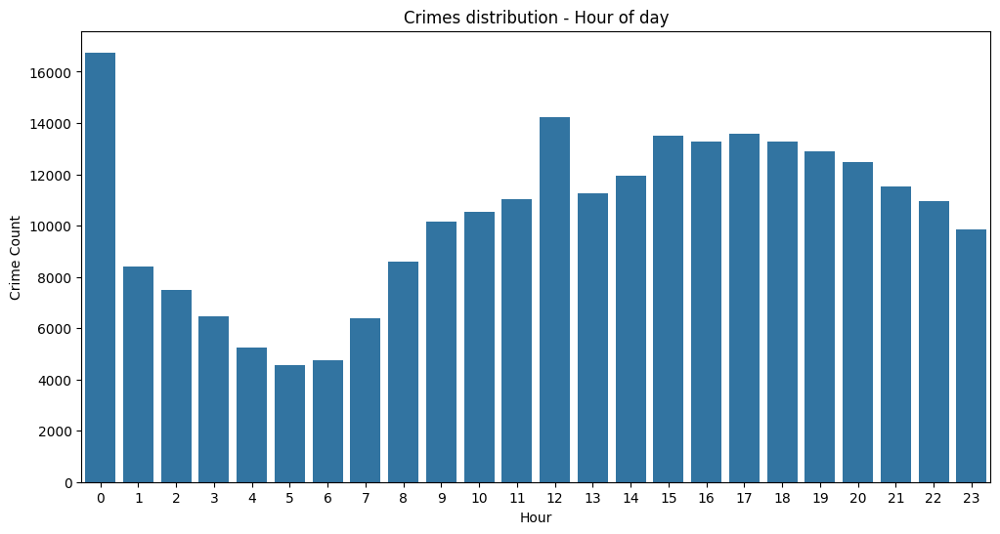

In [67]:
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='Hour')
plt.xticks(range(24))
plt.ylabel("Crime Count")
plt.title('Crimes distribution - Hour of day')
plt.show()

<hr>
<p><b style= 'color: red'>Crimes</b> peaks sharply at <b>midnight (0:00)</b>, decreases significantly until <b>5:00</b>, and then gradually rises throughout the <b>day</b>, with another peak around <b>noon (12:00)</b> before gradually decreasing again into the late <b>evening</b>. This can directly correlate with the fact that the hihest crime type was theft, and thieves obviously would prefer to attack at midnight.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 5</i></b></p>

<h1>Crime Type Distribution – What kinds of crimes happen?</h1>
<p>After understanding when crimes occur, the next step is to examine what kinds of crimes dominate the city.</p>

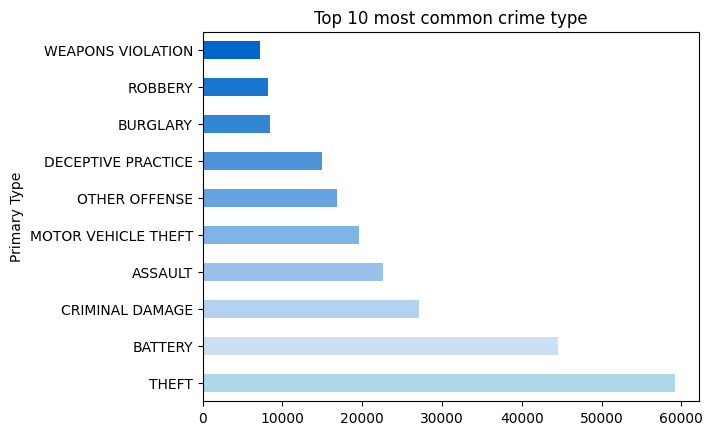

0.23763763281591824

In [217]:
colors = ["lightblue","#cce0f5","#b3d1f0","#99c2eb","#80b3e6","#66a3e0","#4d94db","#3385d6","#1a75d1","#0066cc"] 
df['Primary Type'].value_counts().head(10).plot(kind='barh', color=colors)
plt.title('Top 10 most common crime type')
plt.show()

df[df['Primary Type'] == "THEFT"].value_counts().sum() / df.value_counts().sum() #PERCENTAGE

<hr>
<p>Almost 1 in 4 reported crimes are direct <b style='color:red''>Theft</b>  wihch accounts for nearly <b>24%</b> among all crimes, which followed by <b>battery</b> and <b>criminal damage</b>.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 6</i></b></p>

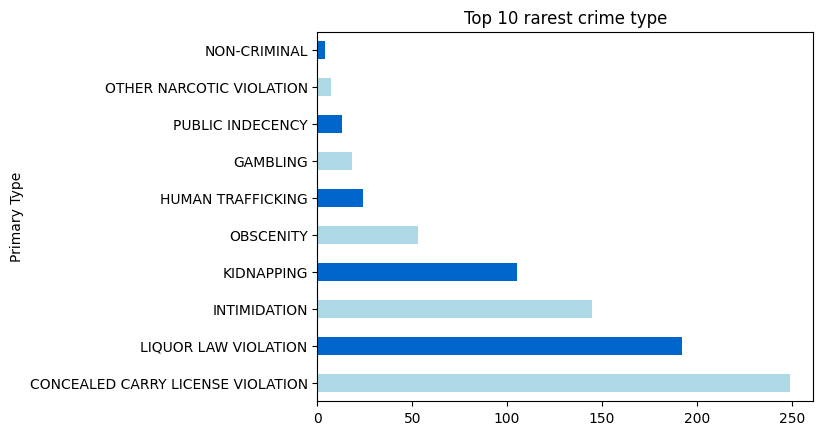

In [389]:
df['Primary Type'].value_counts().tail(10).plot(kind='barh', color=colors)
plt.title('Top 10 rarest crime type')
plt.show()

<hr>
<p>While <b style='color:red''>Theft</b> is the most common type, <b>non-criminal, narcotic violations, and public indecency</b> are the rarest.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 7</i></b></p>

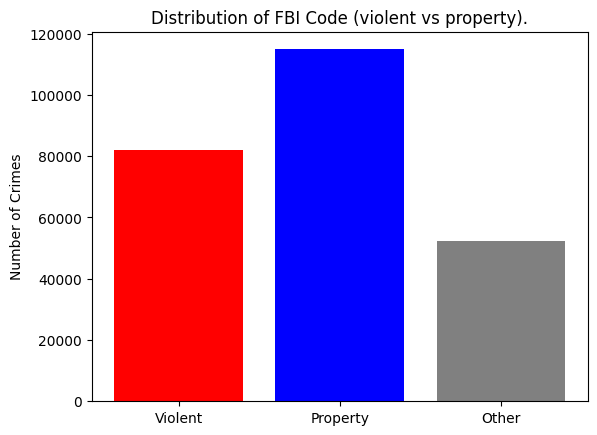

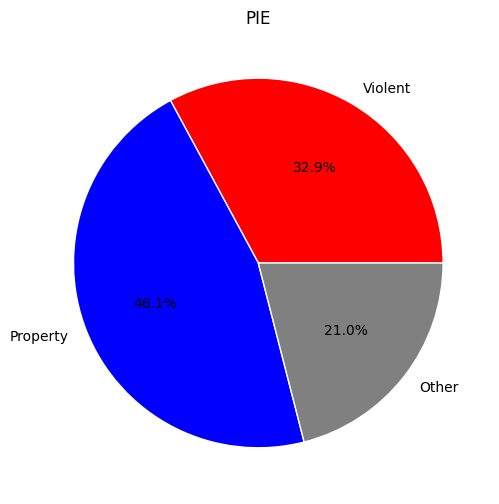

In [216]:
df['Violent'] = df['FBI Code'].isin(['01A','01B','02','03','04A','04B','08A','08B']) 
df['Property'] = df['FBI Code'].isin(['05','06','07','09','13','14']) 
df['Other'] = df['FBI Code'].isin(['10', '11', '12', '15', '16', '17', '18', '19', '20', '22', '24', '26'])

categories = ["Violent", "Property", "Other"]

plt.bar(categories, fbiTypes, color=['red','blue','gray'])
plt.title("Distribution of FBI Code (violent vs property).")
plt.ylabel("Number of Crimes")
plt.show()

crime_groups = df[['Violent','Property','Other']].sum()
crime_groups.plot(kind="pie", autopct='%1.1f%%', figsize=(6,6), wedgeprops= {'edgecolor': 'white'}, colors=['red','blue','gray'])
plt.title("PIE")
plt.show()

<p><i>Note: 01A, 01B, 02, 03, 04A, 04B, 08A, 08B are marked <b style='color:red'>violent crimes</b> by the FBI, while 05, 06, 07, 09, 14, 13 are <b style='color:red'>property crimes</b>. Other crimes are 10, 11, 12, 15, 16, 17, 18, 19, 20, 22, 24, 26.</i></p>

<hr>
<p>The distribution of <b>FBI crime</b> codes reveals that <b style='color:red;'>property crimes</b> such as <i>burglary, larceny, motor vehicle theft, arson, etc.</i> are more prevalent with <b>46%</b> than <b style='color:red;'>violent crimes</b> (<i>homicide, sexual assault, robbery, assault, etc.</i>)with <b>32%</b>, with a significant number of crimes falling into the "Other" category with <b>21%</b>.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 8</i></b></p>

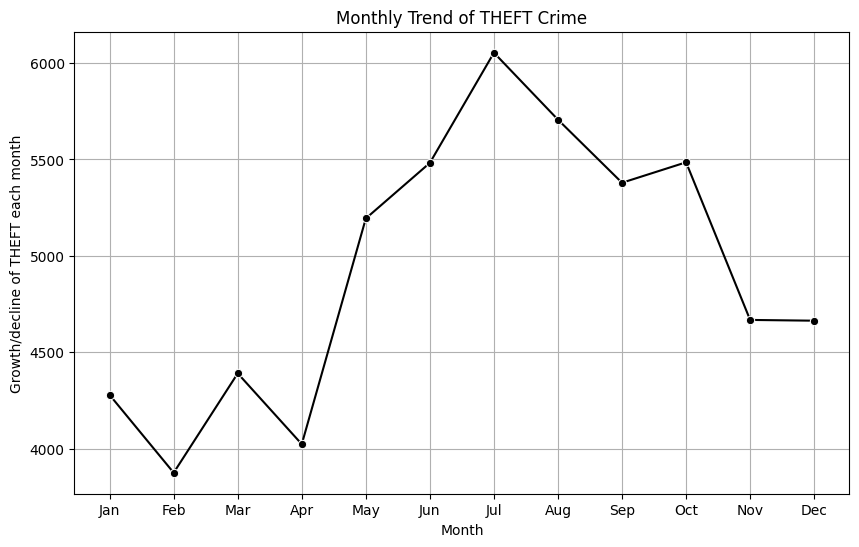

In [206]:
theftDecline = df[df['Primary Type'] == 'THEFT'].groupby('Month').size()
theftDecline = theftDecline.reset_index(name='Count')

plt.figure(figsize=(10,6))
sns.lineplot(data=theftDecline, x='Month', y='Count', marker="o", color='black')
plt.title("Monthly Trend of THEFT Crime")
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.ylabel("Growth/decline of THEFT each month")
plt.grid()
plt.show()


<hr>
<p><b style='color:red;'>Theft</b> crimes indicates a significant increase from <b>April to July</b>, followed by a decline towards the end of the year, with the lowest levels observed in <b>February and April</b>.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 9</i></b></p>

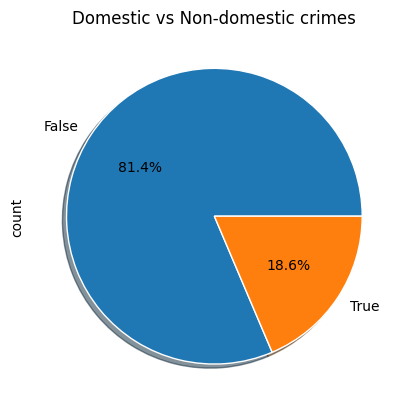

In [61]:
domPercentage = df['Domestic'].value_counts()
domPercentage.plot(kind='pie', autopct='%1.1f%%', wedgeprops = {'edgecolor': 'white'}, shadow= True)
plt.title('Domestic vs Non-domestic crimes')
plt.show()

<hr>
<p>More than <b>18%</b> was <b style='color:red'>Domestic</b> meaning the crime involved <i>family members, household members, or people in a domestic relationship (spouses, ex-partners, children, relatives, people living together, etc.)</i> while <b>81%</b> was  not.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 10</i></b></p>

<h1>Arrest & Enforcement (What happens after?)</h1>
<p>Understanding crime types is incomplete without knowing how often they lead to arrests.</p>

Text(0.5, 0, 'Arrest Rate (%)')

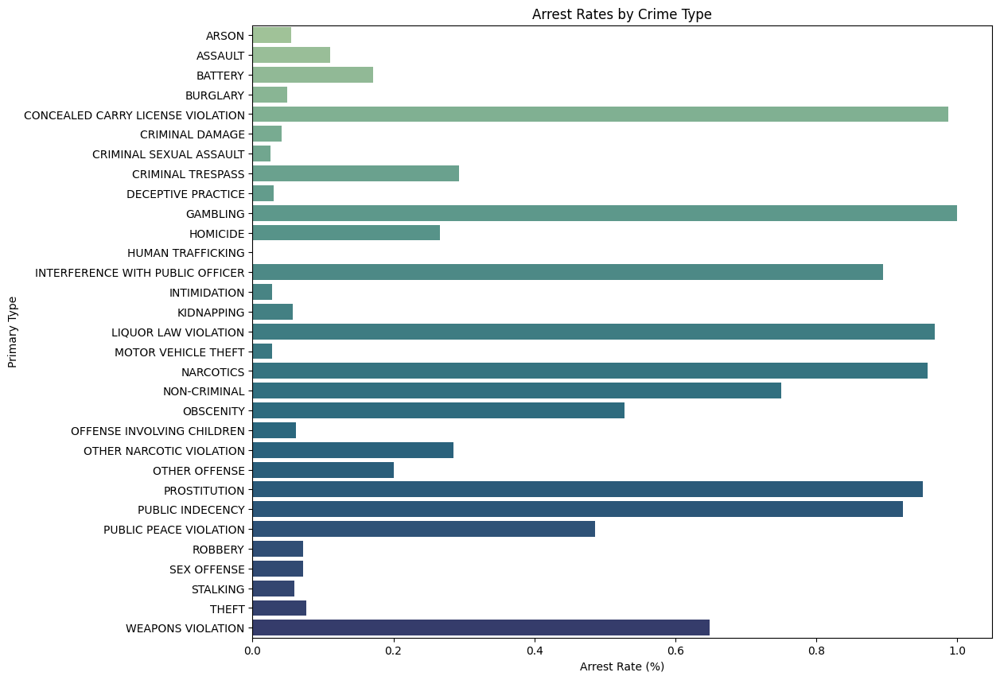

In [247]:
plt.figure(figsize=(12, 10))
arrestRate = df.groupby('Primary Type')['Arrest'].mean().sort_values(ascending=False)
sns.barplot(x=arrestRate.values, y=arrestRate.index, palette="crest")
plt.title("Arrest Rates by Crime Type")
plt.xlabel("Arrest Rate (%)")

<hr>
<p><b style='color:red;'>Theft</b>, despite being the most common crime type, sits lower as shown in the figure <i>Arrest Rates by Crime Type.</i> You're likely to get arrested more if you <b>gamble</b>. <b style='color:red;'>Human trafficking</b> rarely gets arrested.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 11</i></b></p>

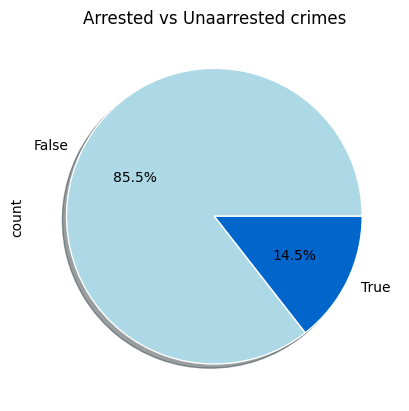

In [248]:
colors = ["lightblue","#0066cc"] 

arrestPercentage = df['Arrest'].value_counts()
arrestPercentage.plot(kind='pie', autopct='%1.1f%%', wedgeprops = {'edgecolor': 'white'}, shadow= True, colors=colors)
plt.title('Arrested vs Unaarrested crimes')
plt.show()

<hr>
<p>Among all recorded crimes, only around <b>14%</b> was <b style="color:red">arrested</b>. Nearly <b>86%</b> was  not, most likely because the suspect got away.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 12</i></b></p>

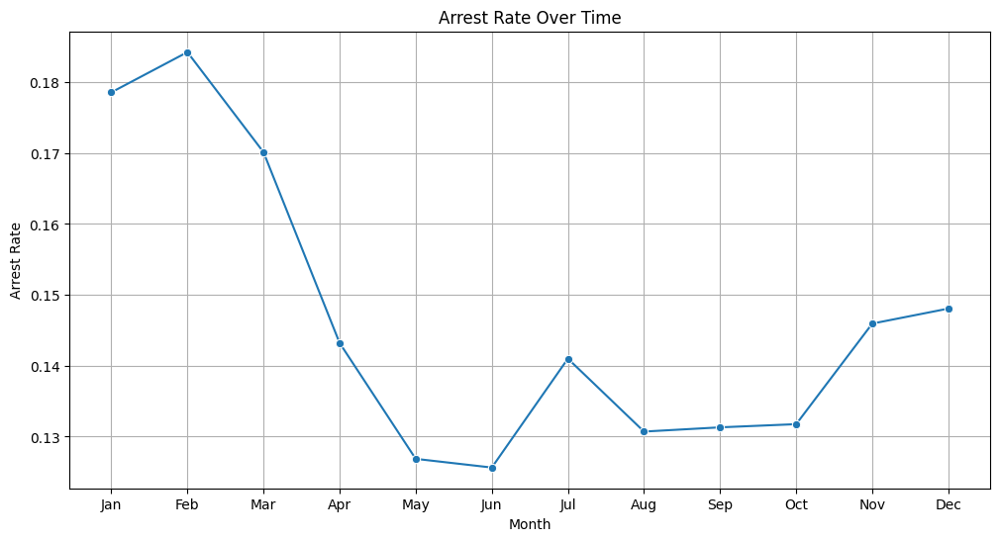

In [234]:
arrestTrend = df.groupby('Month')['Arrest'].mean().reset_index()
plt.figure(figsize= (12, 6))
sns.lineplot(data=arrestTrend, x='Month', y='Arrest', marker='o')
plt.title("Arrest Rate Over Time")
plt.ylabel("Arrest Rate")
plt.grid()
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

<hr>
<p>The arrest rate shows significant seasonal <b>downfall</b>, starting high in <b>January and February</b>, then declining through <b>May and June</b>. The trend indicates that arrest varies seasonally, probably by factors like weather adn holidays.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 13</i></b></p>

<h1>Location Analysis (Where do crimes happen?)</h1>
<p>Beyond time and type, geography reveals another layer of insight.</p>

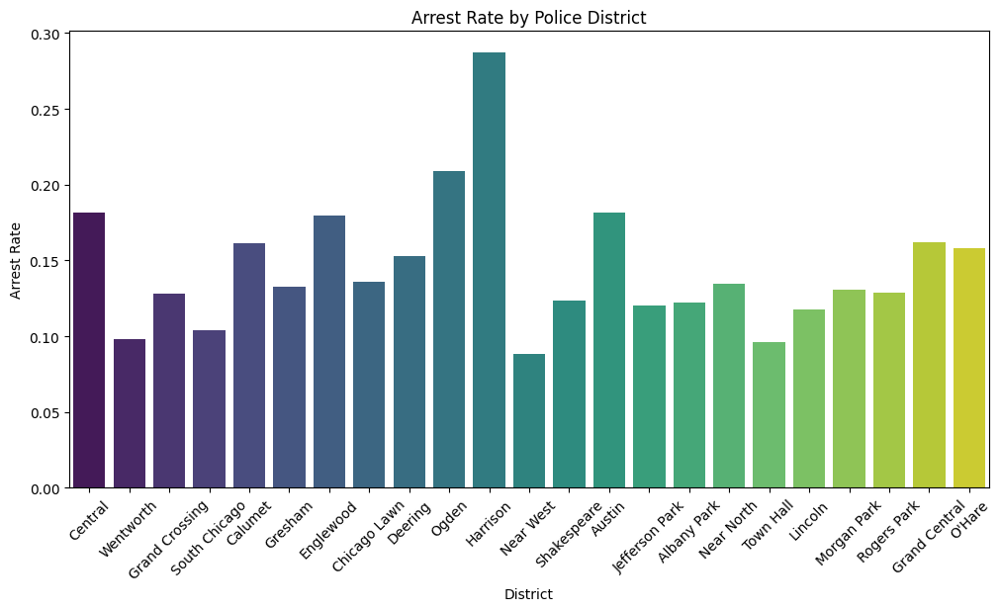

In [285]:
#ADD NAMES TO DISTRICTS
districtMap = {
    1: "Central",
    2: "Wentworth",
    3: "Grand Crossing",
    4: "South Chicago",
    5: "Calumet",
    6: "Gresham",
    7: "Englewood",
    8: "Chicago Lawn",
    9: "Deering",
    10: "Ogden",
    11: "Harrison",
    12: "Near West",
    14: "Shakespeare",
    15: "Austin",
    16: "Jefferson Park",
    17: "Albany Park",
    18: "Near North",
    19: "Town Hall",
    20: "Lincoln",
    22: "Morgan Park",
    24: "Rogers Park",
    25: "Grand Central",
    31: "O'Hare"
}
arrest_by_district['District Name'] = arrest_by_district['District'].map(districtMap)

plt.figure(figsize=(12,6))
sns.barplot(data=arrest_by_district, x='District Name', y='Arrest', palette="viridis")
plt.xticks(rotation=45)
plt.title("Arrest Rate by Police District")
plt.ylabel("Arrest Rate")
plt.xlabel("District")
plt.show()


<hr>
<p>The arrest rate varies considerably across different police districts, with <b>Harrison District </b> exhibiting the highest arrest rate, significantly exceeding the rates in other districts.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 14</i></b></p>

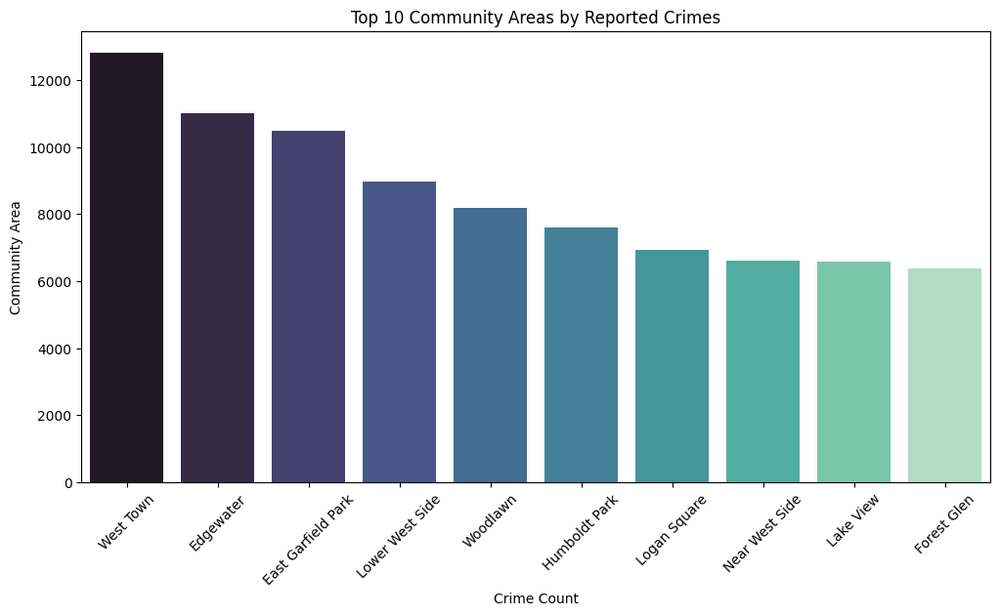

In [286]:
topAreasNames = top_areas.rename(index=communityAreaMap)

plt.figure(figsize=(12,6))
sns.barplot(y=topAreasNames.values, x=topAreasNames.index, palette="mako")
plt.title("Top 10 Community Areas by Reported Crimes")
plt.xlabel("Crime Count")
plt.ylabel("Community Area")
plt.xticks(rotation=45)
plt.show()

<hr>
<p><b>West Town</b> experienced the highest reported crime counts among the top 10 community areas. Be <b style='color:red'>cautious</b> when entering these type of areas.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 15</i></b></p>

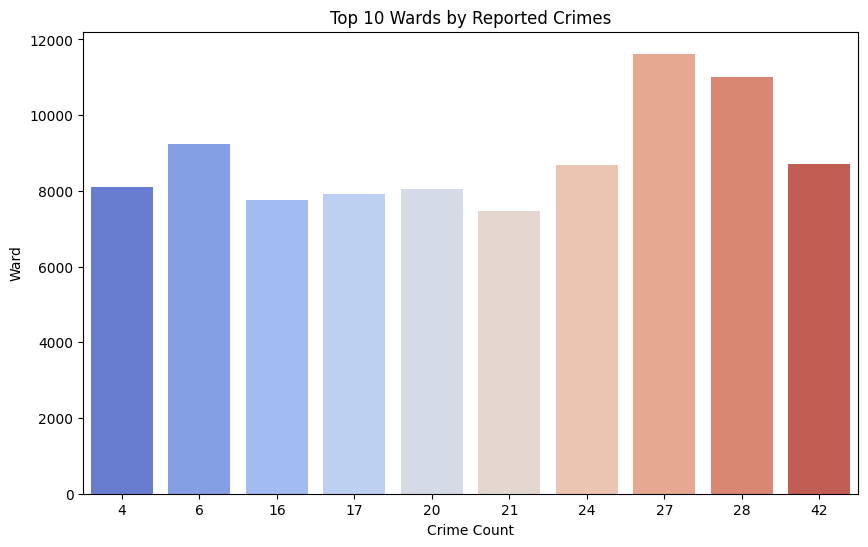

In [287]:
topWards = df['Ward'].value_counts().head(10)

plt.figure(figsize=(10,6))
sns.barplot(y=topWards.values, x=topWards.index, palette="coolwarm")
plt.title("Top 10 Wards by Reported Crimes")
plt.xlabel("Crime Count")
plt.ylabel("Ward")
plt.show()

<hr>
<p><b>Wards 27 and 28</b>  exhibit the highest reported crime counts, indicating these wards may require additional resources and targeted crime prevention strategies.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 16</i></b></p>

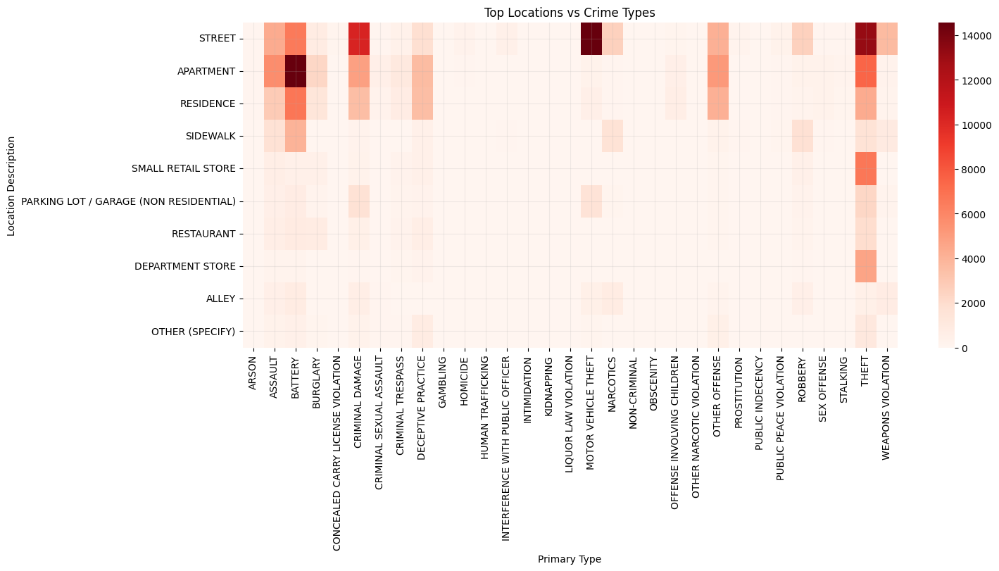

In [297]:
cross = df.groupby(['Location Description', 'Primary Type']).size().unstack().fillna(0)
crossTop = cross.loc[cross.sum(axis=1).sort_values(ascending=False).head(10).index]

plt.figure(figsize=(15,6))
sns.heatmap(crossTop, cmap="Reds", annot=False, cbar=True)
plt.title("Top Locations vs Crime Types")
plt.grid(alpha=0.2)
plt.show()


<hr>
<p><b>Streets and apartments</b> are the most frequent locations for crimes such as <b style= 'color:red'>battery, assault, and motor vehicle theft</b>. So police authorites should probably increase security measures and targeted policing.
</p>

<p style = 'text-align: right;'><b><i>INSIGHT 17</i></b></p>

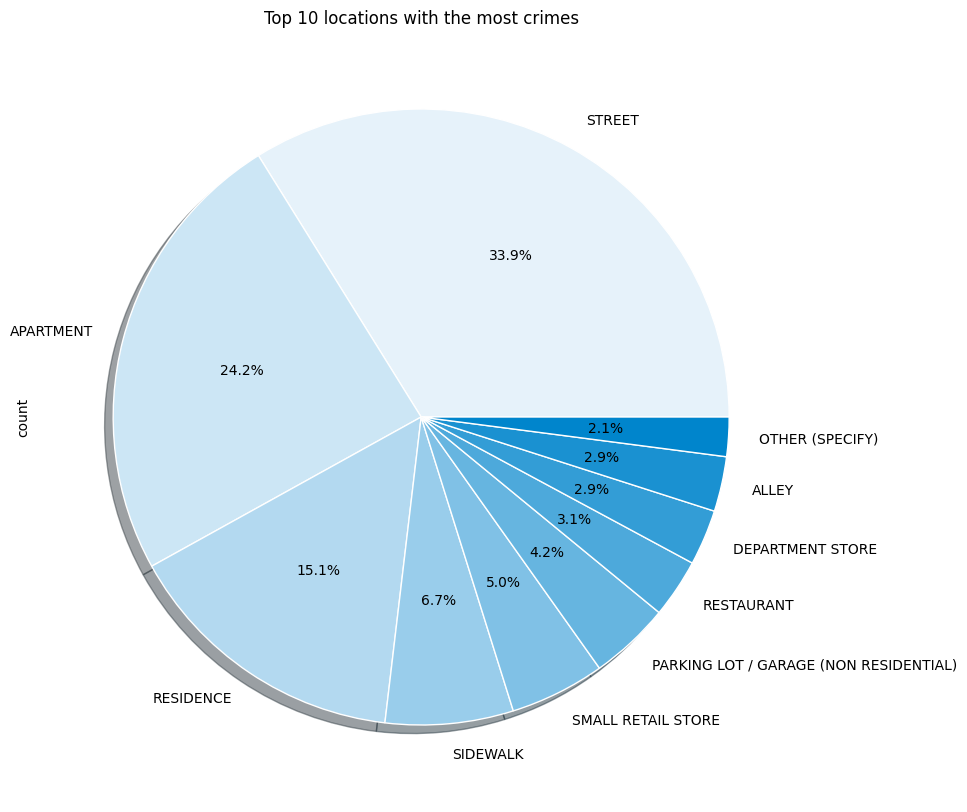

In [7]:
plt.figure(figsize=(10,10))
colors = [
    "#e6f2fa",
    "#cce6f5",
    "#b3d9f0",
    "#99cdeb",
    "#80c1e6",
    "#66b5e0",
    "#4da9db",
    "#339dd6",
    "#1a91d1",
    "#0085cc"
] #KULAY NA BIGAY NI CHATGPT

df['Location Description'].value_counts().head(10).plot(kind='pie', autopct= "%1.1f%%", 
                                                        wedgeprops = {'edgecolor': 'white'}, 
                                                        shadow= True, colors= colors)
plt.title('Top 10 locations with the most crimes')
plt.show()

<hr>
<p>Among all <b>129 locations</b>, most crimes significantly happened in the <b>streets</b> with <b style= 'color:red'>33.9%</b> shares in the top 10 locations.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 18</i></b></p>

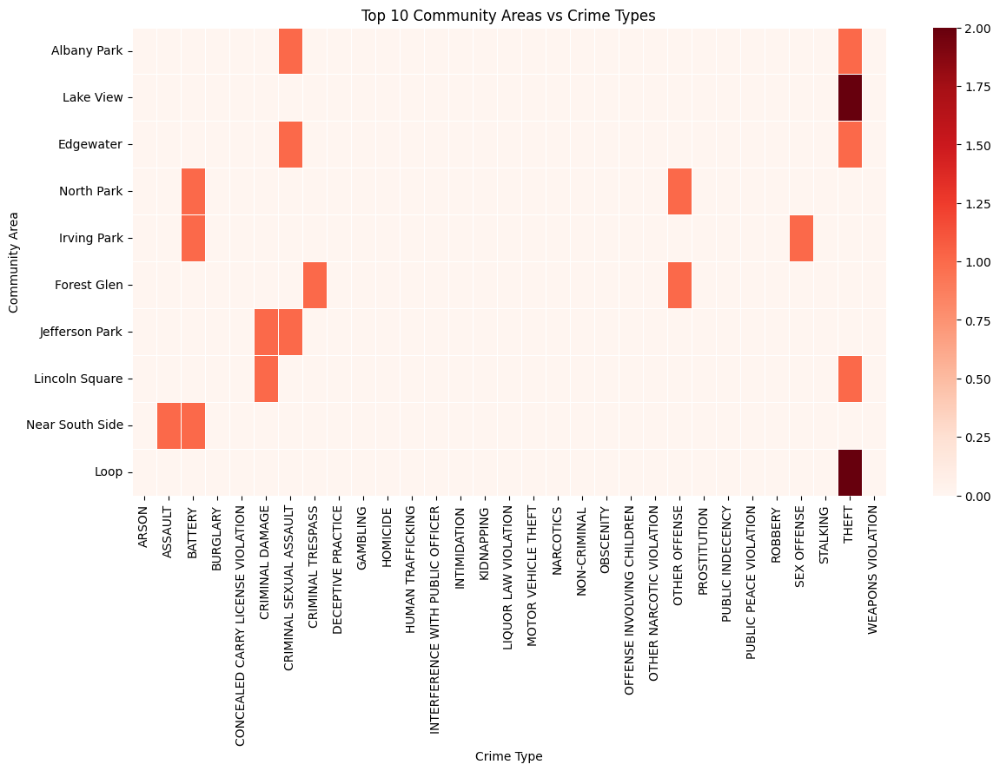

In [303]:
communityCrime = df.groupby([communityAreaMap, 'Primary Type']).size().unstack().fillna(0)
topCommunity = communityCrime.loc[communityCrime.sum(axis=1).sort_values(ascending=False).head(10).index]

plt.figure(figsize=(14,7))
sns.heatmap(topCommunity, cmap="Reds", cbar=True, linewidths=0.5)
plt.title("Top 10 Community Areas vs Crime Types")
plt.xlabel("Crime Type")
plt.ylabel("Community Area")
plt.show()

<hr>
<p>The <b>Loop</b> area shows a high incidence of <b style= 'color:red'>theft</b>, while <b>Jefferson Park</b> experiences a concentration of <b style= 'color:red'>criminal damage and criminal trespass incidents</b>.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 19</i></b></p>

In [373]:
location = list(zip(df['Latitude'], df['Longitude']))

crimeMap = folium.Map(location = [df['Latitude'].mean(), df['Longitude'].mean()], zoom_start = 10 )
HeatMap(location).add_to(crimeMap)

crimeMap.save('ChicagoCrimeMap.html')
crimeMap

<hr>
<p>The <i>Figure</i> shows the heat map of how crimes are distributed across the city of <b>Chicago</b>, with higher density areas appearing towards the center of the city.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 20</i></b></p>

<h1>Domestic vs Non-Domestic Patterns</h1>
<p>About 15–20% of reported crimes are flagged as domestic.</p>

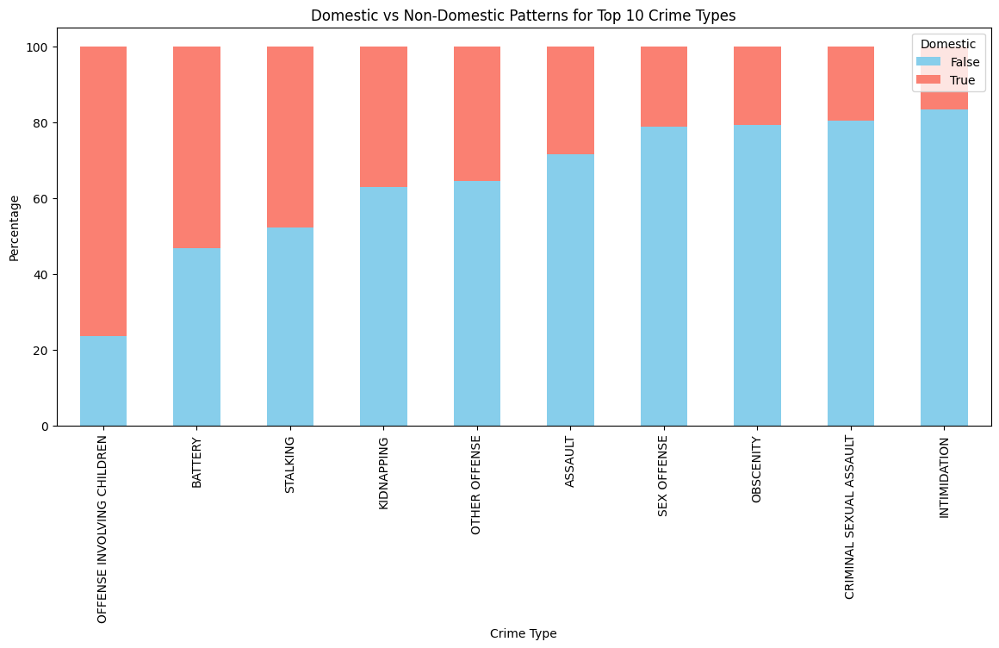

In [329]:
domesticType = df.groupby(['Primary Type','Domestic']).size().unstack(fill_value=0)
domesticTypePCT = domesticType.div(domesticType.sum(axis=1), axis=0) * 100

topCrimes = domesticTypePCT.sort_values(by=True, ascending=False).head(10)

topCrimes.plot(kind='bar', stacked=True, figsize=(14,6), color=['skyblue','salmon'])
plt.title("Domestic vs Non-Domestic Patterns for Top 10 Crime Types")
plt.ylabel("Percentage")
plt.xlabel("Crime Type")
plt.show()

<hr>
<p><b>Offenses involving children</b> are overwhelmingly domestic, while <b>intimidation</b> is rarely domestic, highlighting the varying contexts of different crime types.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 21</i></b></p>

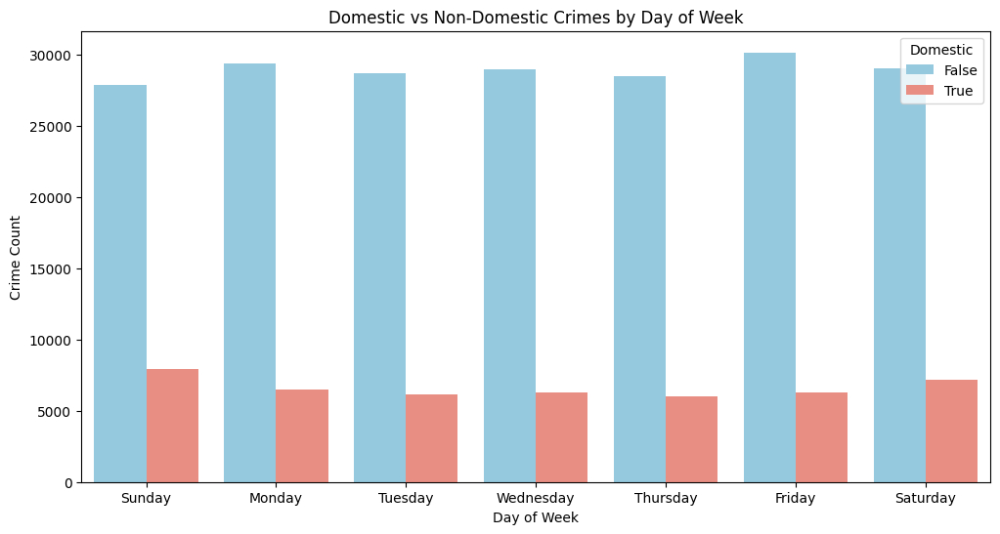

In [326]:
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='DayOfWeekName', hue='Domestic', palette=['skyblue','salmon'])
plt.title("Domestic vs Non-Domestic Crimes by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Crime Count")
plt.show()


<hr>
<p><b>Non-domestic crimes</b> occur more frequently than <b>domestic crimes</b> on every day of the week, with <b>Friday</b> showing a slightly higher incidence of both.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 22</i></b></p>

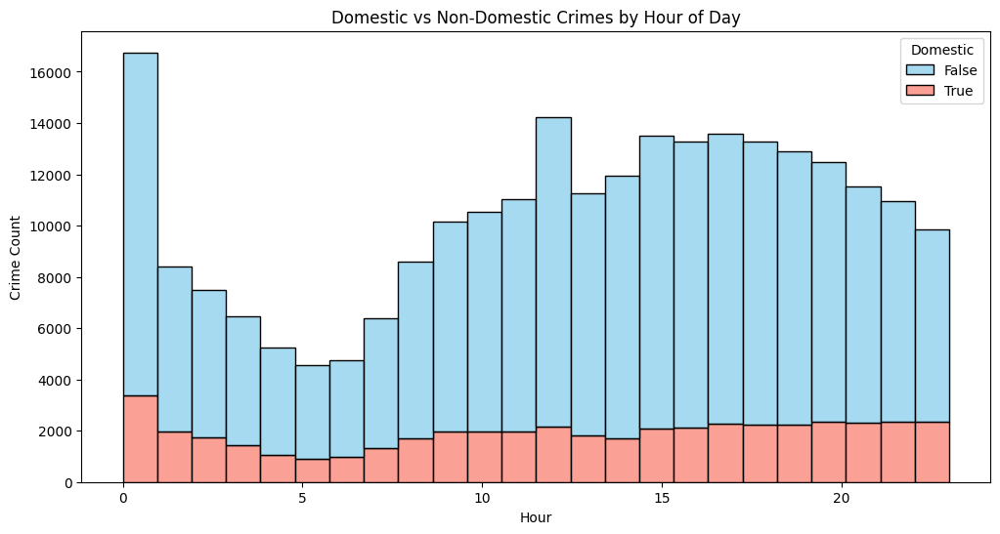

In [332]:
plt.figure(figsize=(12,6))
sns.histplot(data=df, x='Hour', hue='Domestic', multiple='stack', bins=24, palette=['skyblue','salmon'])
plt.title("Domestic vs Non-Domestic Crimes by Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Crime Count")
plt.show()


<hr>
<p><b>Non-domestic crimes</b> peak during the <b>afternoon and evening hours</b>, while <b>domestic crimes</b> show a more consistent level throughout the <b>day</b>, with a slight increase in the late <b>evening.</b></p>

<p style = 'text-align: right;'><b><i>INSIGHT 23</i></b></p>

<h1>Spatial-Temporal Interactions – How do time and place combine?</h1>

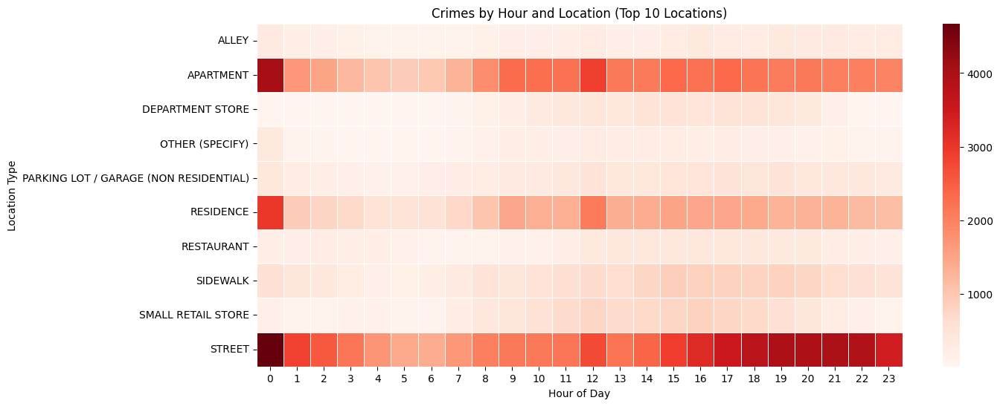

In [341]:
hourLocation = df.groupby(['Hour', 'Location Description']).size().reset_index(name='Count')

topLocations = df['Location Description'].value_counts().head(10).index
hourLocation = hourLocation[hourLocation['Location Description'].isin(topLocations)]

heatmapData = hourLocation.pivot(index='Location Description', columns='Hour', values='Count').fillna(0)

plt.figure(figsize=(14,6))
sns.heatmap(heatmapData, cmap="Reds", linewidths=0.5, annot=False)
plt.title("Crimes by Hour and Location (Top 10 Locations)")
plt.xlabel("Hour of Day")
plt.ylabel("Location Type")
plt.show()

<hr>
<p>Crimes on the <b>street</b> are most frequent during the <b>evening and night hours</b>, while crimes in <b>apartments</b> occur more consistently throughout the <b>day</b>.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 24</i></b></p>

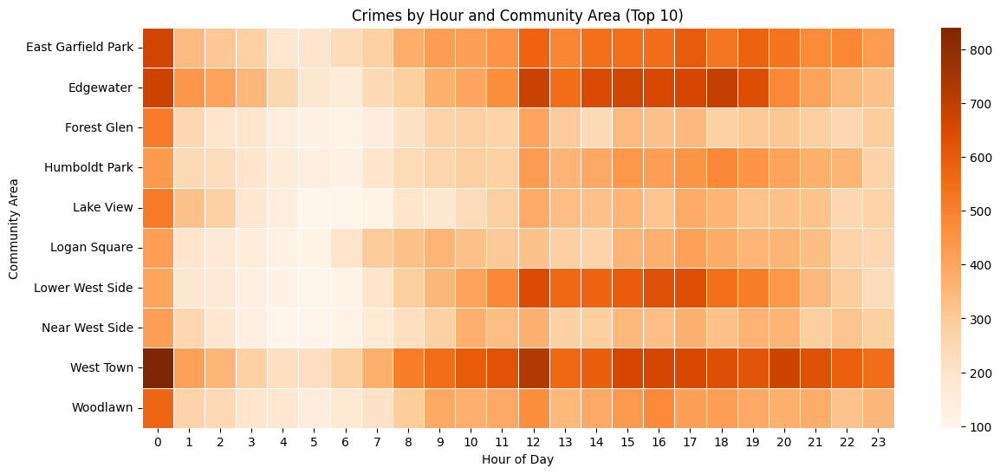

In [356]:
commHour = df.groupby(['Community Area','Hour']).size().reset_index(name='Count')

topCommunities = df['Community Area'].value_counts().head(10).index
commHour = commHour[commHour['Community Area'].isin(topCommunities)]

commHour['Community Area Name'] = commHour['Community Area'].map(communityAreaMap)

commHourP = commHour.pivot(index='Community Area Name', columns='Hour', values='Count').fillna(0)

plt.figure(figsize=(14,6))
sns.heatmap(commHourP, cmap="Oranges", linewidths=0.5)
plt.title("Crimes by Hour and Community Area (Top 10)")
plt.xlabel("Hour of Day")
plt.ylabel("Community Area")
plt.show()


<hr>
<p><b>West Town</b> experiences a higher crime rate during the <b>evening and late-night hours</b>. Crimes in <b>Edgewater</b> increases in the afternoon to evening hours.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 25</i></b></p>

In [372]:
#SPECIFIC DATE 
theftDFJuly = df[(df['Primary Type'] == 'THEFT') & (df['Month'] == 7)]

location = list(zip(theftDFJuly['Latitude'], theftDFJuly['Longitude']))

crimeMap = folium.Map(location = [theftDFJuly['Latitude'].mean(), theftDFJuly['Longitude'].mean()], zoom_start = 10 )
HeatMap(location).add_to(crimeMap)

crimeMap.save('ChicagoCrimeMapJulyTheft.html')
crimeMap

<hr>
<p>This is how <b>theft</b> (<i>the most common crime type according to earlier visuals</i>) was spread out across the map in <b>July</b> (<i>most crimes among months</i>).</p>

<p style = 'text-align: right;'><b><i>INSIGHT 26</i></b></p>

In [379]:
#SPECIFIC DATE 
theftDFFeb = df[(df['Primary Type'] == 'THEFT') & (df['Month'] == 2)]

location = list(zip(theftDFFeb['Latitude'], theftDFFeb['Longitude']))

crimeMap = folium.Map(location = [theftDFFeb['Latitude'].mean(), theftDFFeb['Longitude'].mean()], zoom_start = 10 )
HeatMap(location).add_to(crimeMap)

crimeMap.save('ChicagoCrimeMapFebTheft.html')
crimeMap

<hr>
<p>While this is how <b>theft</b> looks like across the map in <b>February</b> (<i>least crimes among months</i>).</p>

<p style = 'text-align: right;'><b><i>INSIGHT 27</i></b></p>

In [380]:
#SPECIFIC DATE 
domesticDF = df[df["Domestic"] == True]

location = list(zip(domesticDF['Latitude'], domesticDF['Longitude']))

crimeMap = folium.Map(location = [domesticDF['Latitude'].mean(), domesticDF['Longitude'].mean()], zoom_start = 10 )
HeatMap(location).add_to(crimeMap)

#crimeMap.save('ChicagoCrimeMapFebTheft.html')
crimeMap

<hr>
<p>This is how <b>Domestic crimes</b> spreads across the map. It is more dense on the <b>central and southern part</b> of the City.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 28</i></b></p>

In [381]:
#SPECIFIC DATE 
arrestDF = df[df["Arrest"] == False]

location = list(zip(arrestDF['Latitude'], arrestDF['Longitude']))

crimeMap = folium.Map(location = [arrestDF['Latitude'].mean(), arrestDF['Longitude'].mean()], zoom_start = 10 )
HeatMap(location).add_to(crimeMap)

#crimeMap.save('ChicagoCrimeMapFebTheft.html')
crimeMap

<hr>
<p>This is how <b>unarrested crimes</b> spreads across the map. One better <b>watch out</b> in these areas as there are a lot of uncaught criminals.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 29</i></b></p>

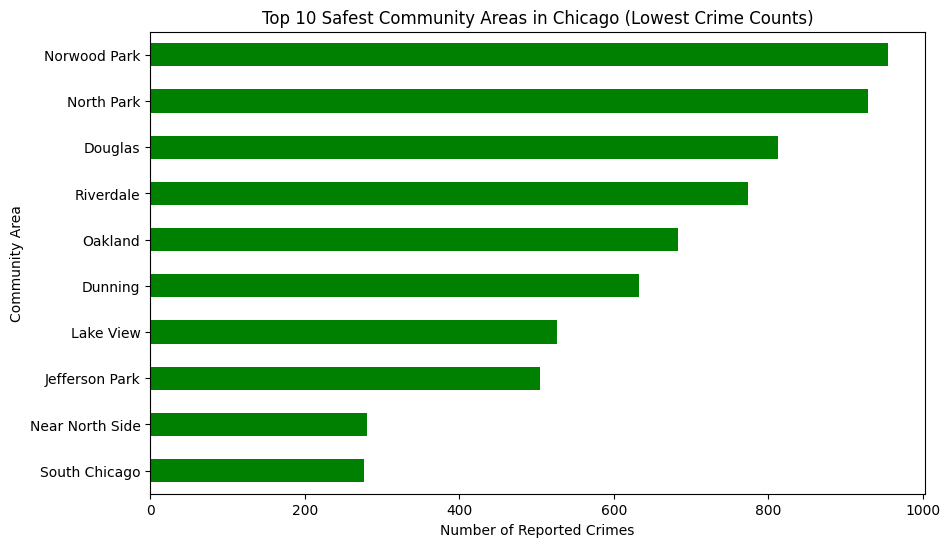

In [387]:
crimeCounts = df['Community Area'].value_counts().sort_values()
crimeCounts.index = crimeCounts.index.map(communityAreaMap)
safestAreas = crimeCounts.head(10)

plt.figure(figsize=(10,6))
safestAreas.plot(kind='barh', color='green')
plt.title("Top 10 Safest Community Areas in Chicago (Lowest Crime Counts)")
plt.xlabel("Number of Reported Crimes")
plt.ylabel("Community Area")
plt.show()

<hr>
<p><b>South Chicago</b> and <b>Near North Side</b> are the safest community areas in Chicago as they have the lowest reported crime counts.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 30</i></b></p>

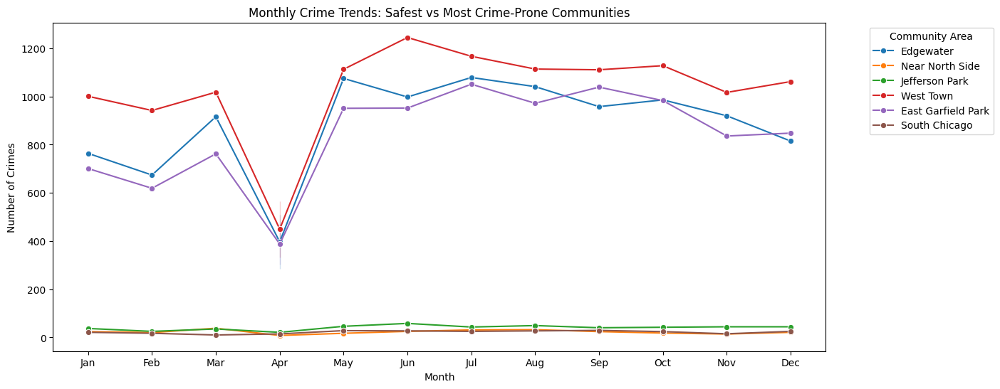

In [398]:
monthlyCrimes = df.groupby(['Year','Month','Community Area']).size().reset_index(name='Count')
monthlyCrimes['Community Area Name'] = monthlyCrimes['Community Area'].map(communityAreaMap)

totalCrimes = df['Community Area'].value_counts()
safest = totalCrimes.nsmallest(3).index
mostCrime = totalCrimes.nlargest(3).index
selectedAreas = list(safest) + list(mostCrime)

monthlyCrimesFiltered = monthlyCrimes[monthlyCrimes['Community Area'].isin(selectedAreas)]

plt.figure(figsize=(14,6))
sns.lineplot(data=monthlyCrimesFiltered, x='Month', y='Count', hue='Community Area Name', marker='o')
plt.title("Monthly Crime Trends: Safest vs Most Crime-Prone Communities")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")
plt.legend(title='Community Area', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

<hr>
<p>Crime trends in the <b>safest communities</b> remain relatively stable throughout the year, while crime rates in the <b>most crime-prone communities</b> fluctuate more significantly, particularly during the summer months.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 31</i></b></p>

<h1>Emerging Trends & Correlations</h1>

In [425]:
#PROPORTION OF ARRESTS BY CRIME TYPE 
arrestByType = df.groupby('Primary Type')['Arrest'].mean().sort_values(ascending=False)
arrestByType.head(10)

Primary Type
GAMBLING                             1.000000
CONCEALED CARRY LICENSE VIOLATION    0.987952
LIQUOR LAW VIOLATION                 0.968750
NARCOTICS                            0.958352
PROSTITUTION                         0.951220
PUBLIC INDECENCY                     0.923077
INTERFERENCE WITH PUBLIC OFFICER     0.894942
NON-CRIMINAL                         0.750000
WEAPONS VIOLATION                    0.648520
OBSCENITY                            0.528302
Name: Arrest, dtype: float64

<hr>
<p><b>Violent crimes</b> like <i>HOMICIDE, CRIMINAL SEXUAL ASSAULT, ROBBERY</i> have higher arrest probabilities, while <b>property crimes</b> like <i>THEFT, MOTOR VEHICLE THEFT</i> tend to have lower arrest rates.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 32</i></b></p>

In [426]:
#CORRELATIONM OF ARREST AND DOMESTIC
df['Arrest'].corr(df['Domestic'])

0.005256201490292576

<hr>
<p><b>Negative correlation</b> appears between Domestic and Arrest, meaning domestic incidents are slightly less likely to result in arrests than non-domestic crimes.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 33</i></b></p>

In [427]:
#WEEKDAY AND WEEKEND CRIME PATTERN
df['DayType'] = df['DayOfWeek'].apply(lambda x: 'Weekend' if x >=5 else 'Weekday')
weekend_ratio = df.groupby('Primary Type')['DayType'].value_counts(normalize=True).unstack().fillna(0)
weekend_ratio.head(10)

DayType,Weekday,Weekend
Primary Type,,
ARSON,0.710177,0.289823
ASSAULT,0.717577,0.282423
BATTERY,0.675946,0.324054
BURGLARY,0.734928,0.265072
CONCEALED CARRY LICENSE VIOLATION,0.714859,0.285141
CRIMINAL DAMAGE,0.686056,0.313944
CRIMINAL SEXUAL ASSAULT,0.650350,0.349650
CRIMINAL TRESPASS,0.751239,0.248761
DECEPTIVE PRACTICE,0.771997,0.228003


<hr>
<p><b>Burglary and deceptive practices</b> are more likely to occur on weekdays, while <b>criminal sexual assault and gambling</b> have a higher incidence on weekends.</p>

<p style = 'text-align: right;'><b><i>INSIGHT 34</i></b></p>

In [428]:
#DOMESTIC CRIME TIMING
domestic_hour = df[df['Domestic']==True]['Hour'].value_counts(normalize=True).sort_index()
domestic_hour

Hour
0     0.073209
1     0.042376
2     0.037478
3     0.030595
4     0.022526
5     0.019721
6     0.021037
7     0.028179
8     0.036701
9     0.042635
10    0.042829
11    0.042851
12    0.046648
13    0.039010
14    0.036939
15    0.044598
16    0.045440
17    0.049259
18    0.048266
19    0.048072
20    0.050575
21    0.049820
22    0.050381
23    0.050856
Name: proportion, dtype: float64

<hr>
<p><b>Domestic crimes</b> are most frequent at <b>midnight</b> (hour 0), with a proportion of <b>0.073</b>, and also relatively high between <b>5 PM</b> (hour 17) and <b>11 PM</b> (hour 23).</p>

<p style = 'text-align: right;'><b><i>INSIGHT 35</i></b></p>

<p style = 'text-align: right;'><i>Prepared by</i><b> Johnrey Mansilungan</b></p>